In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.figure_factory as ff

In [2]:
data=pd.read_csv('water_potability.csv')
data.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [3]:
data.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [5]:
data.shape

(3276, 10)

In [6]:
for i in data.columns:
    if data[i].isnull().sum()>0:
        print("There are {} null values in {} column".format(data[i].isnull().sum(),i))

There are 491 null values in ph column
There are 781 null values in Sulfate column
There are 162 null values in Trihalomethanes column


In [7]:
data['ph'].describe()

count    2785.000000
mean        7.080795
std         1.594320
min         0.000000
25%         6.093092
50%         7.036752
75%         8.062066
max        14.000000
Name: ph, dtype: float64

In [8]:
data['ph_mean']=data['ph'].fillna(data['ph'].mean())
data['ph_mean'].isnull().sum()

0

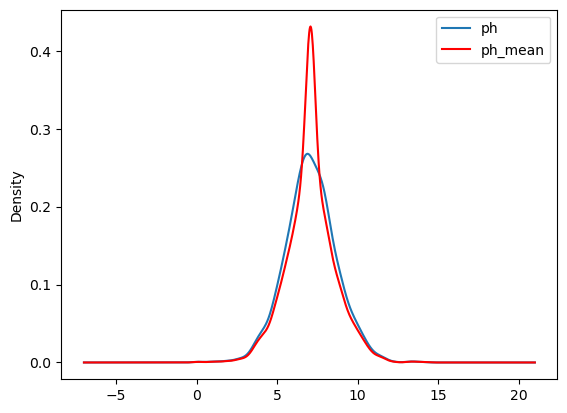

In [9]:
fig = plt.figure()
ax = fig.add_subplot(111)
data['ph'].plot(kind='kde', ax=ax)
data.ph_mean.plot(kind='kde', ax=ax, color='red')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')
plt.show()

In [10]:
def impute_nan(df,variable):
    df[variable+"_random"]=df[variable]
   
    random_sample=df[variable].dropna().sample(df[variable].isnull().sum(),random_state=0)
  
    random_sample.index=df[df[variable].isnull()].index
    df.loc[df[variable].isnull(),variable+'_random']=random_sample

In [11]:
impute_nan(data,"ph")

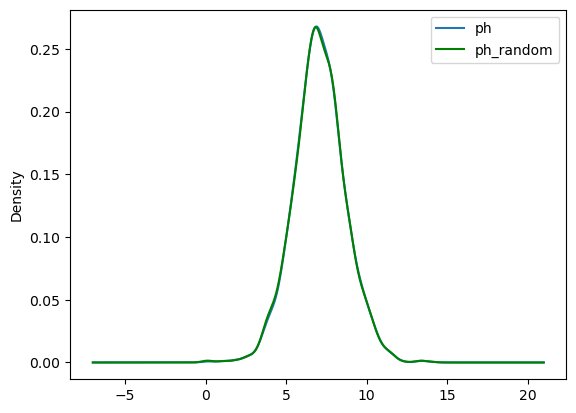

In [12]:
fig = plt.figure()
ax = fig.add_subplot(111)
data['ph'].plot(kind='kde', ax=ax)
data.ph_random.plot(kind='kde', ax=ax, color='green')

lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')
plt.show()

In [13]:
impute_nan(data,"Sulfate")

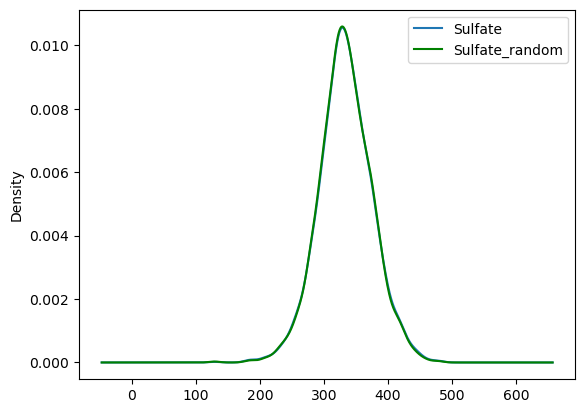

In [14]:
fig = plt.figure()
ax = fig.add_subplot(111)
data['Sulfate'].plot(kind='kde', ax=ax)
data["Sulfate_random"].plot(kind='kde', ax=ax, color='green')

lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')
plt.show()

In [15]:
impute_nan(data,"Trihalomethanes")

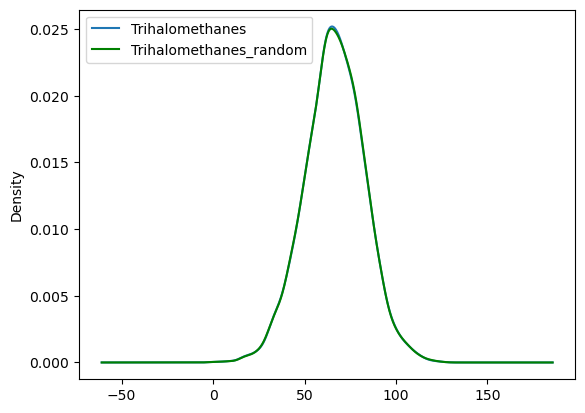

In [16]:
fig = plt.figure()
ax = fig.add_subplot(111)
data['Trihalomethanes'].plot(kind='kde', ax=ax)
data.Trihalomethanes_random.plot(kind='kde', ax=ax, color='green')
lines, labels = ax.get_legend_handles_labels()
ax.legend(lines, labels, loc='best')
plt.show()

In [17]:
data=data.drop(['ph','Sulfate','Trihalomethanes','ph_mean'],axis=1)

In [18]:
data.isnull().sum()

Hardness                  0
Solids                    0
Chloramines               0
Conductivity              0
Organic_carbon            0
Turbidity                 0
Potability                0
ph_random                 0
Sulfate_random            0
Trihalomethanes_random    0
dtype: int64

C:\Users\ASL\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


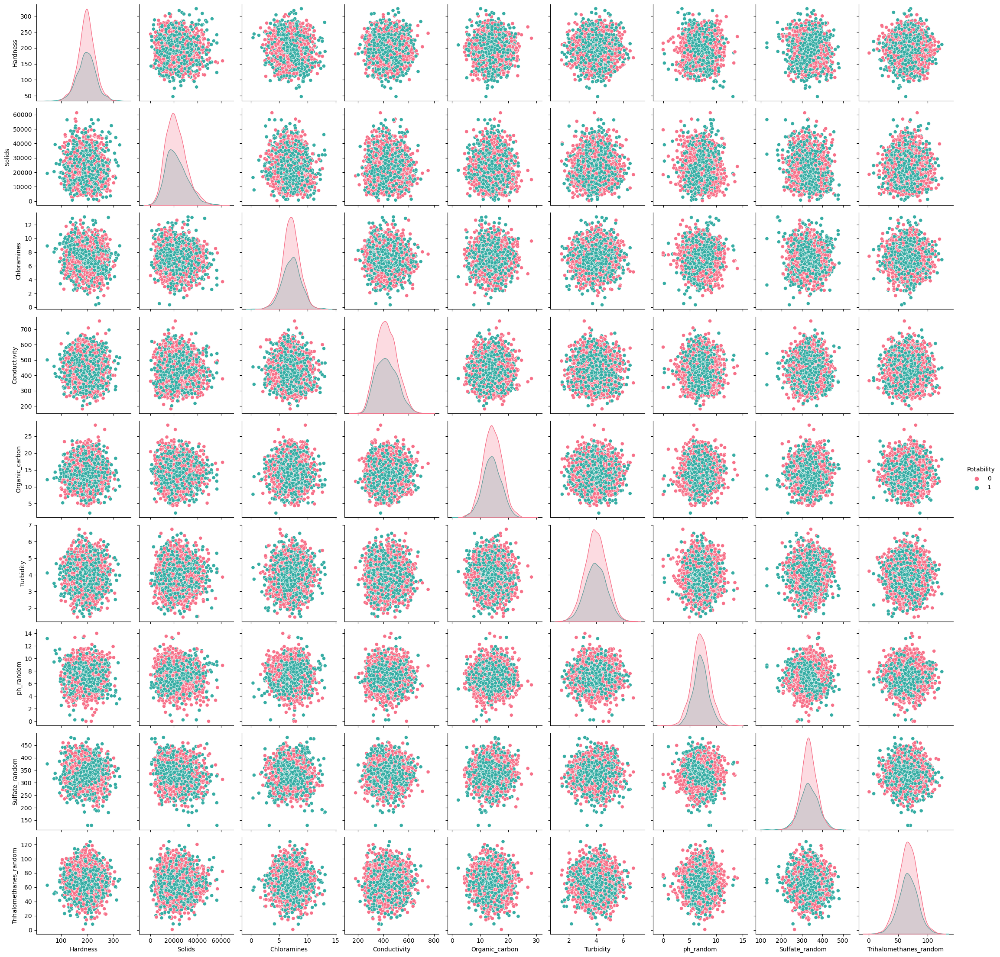

In [19]:
sns.pairplot(data, hue="Potability", palette="husl");

In [20]:
data['Hardness'].describe()

count    3276.000000
mean      196.369496
std        32.879761
min        47.432000
25%       176.850538
50%       196.967627
75%       216.667456
max       323.124000
Name: Hardness, dtype: float64

C:\Users\ASL\AppData\Local\Temp\ipykernel_3240\3589006849.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['Hardness'])


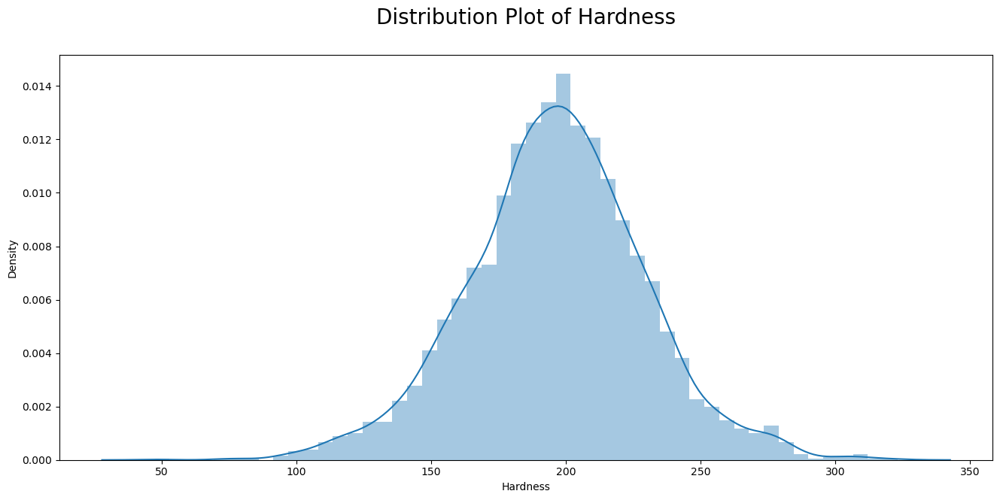

In [21]:
plt.figure(figsize = (16, 7))
sns.distplot(data['Hardness'])
plt.title('Distribution Plot of Hardness\n', fontsize =  20)
plt.show()


In [22]:
fig = px.scatter(data,range(data['Hardness'].count()), sorted(data['Hardness']),
                 color=data['Potability'],
                 labels={
                     'x': "Count",
                     'y': "Hardness",
                     'color':'Potability'
                     
                 }, template = 'plotly_dark')
fig.update_layout(title='Hardness wrt Potability')
fig.show()

In [23]:
data['Solids'].describe()

count     3276.000000
mean     22014.092526
std       8768.570828
min        320.942611
25%      15666.690297
50%      20927.833607
75%      27332.762127
max      61227.196008
Name: Solids, dtype: float64

C:\Users\ASL\AppData\Local\Temp\ipykernel_3240\3382118340.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




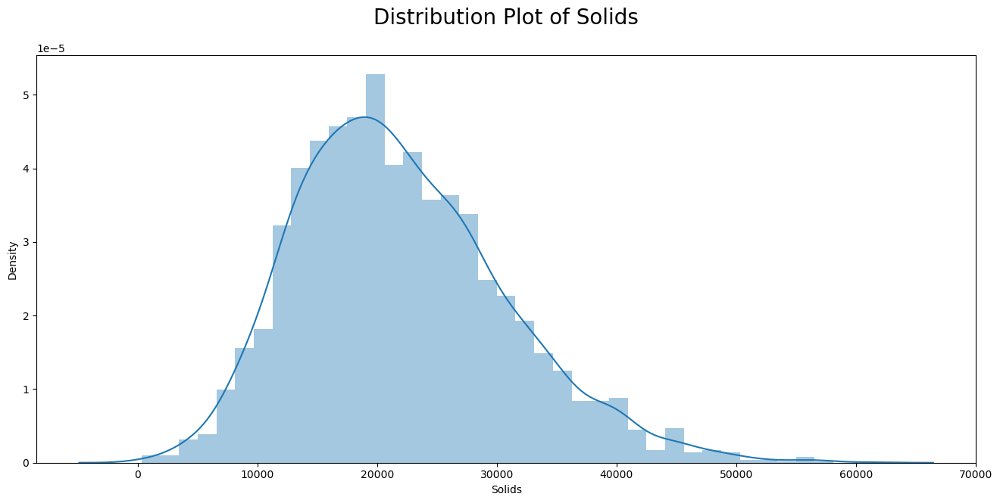

In [24]:
plt.figure(figsize = (16, 7))
sns.distplot(data['Solids'])
plt.title('Distribution Plot of Solids\n', fontsize =  20)
plt.show()

In [25]:
fig = px.scatter(data,range(data['Solids'].count()), sorted(data['Solids']),
                 color=data['Potability'],
                 labels={
                     'x': "Count",
                     'y': "Solids",
                     'color':'Potability'
                     
                 },
                 color_continuous_scale=px.colors.sequential.tempo,
                 template = 'plotly_dark')
fig.update_layout(title='Solids wrt Potability')
fig.show()

In [26]:

px.histogram(data_frame = data, x = 'Solids', nbins = 10, color = 'Potability', marginal = 'box',
             template = 'plotly_dark')

In [27]:
data['Chloramines'].describe()

count    3276.000000
mean        7.122277
std         1.583085
min         0.352000
25%         6.127421
50%         7.130299
75%         8.114887
max        13.127000
Name: Chloramines, dtype: float64

C:\Users\ASL\AppData\Local\Temp\ipykernel_3240\2426746088.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




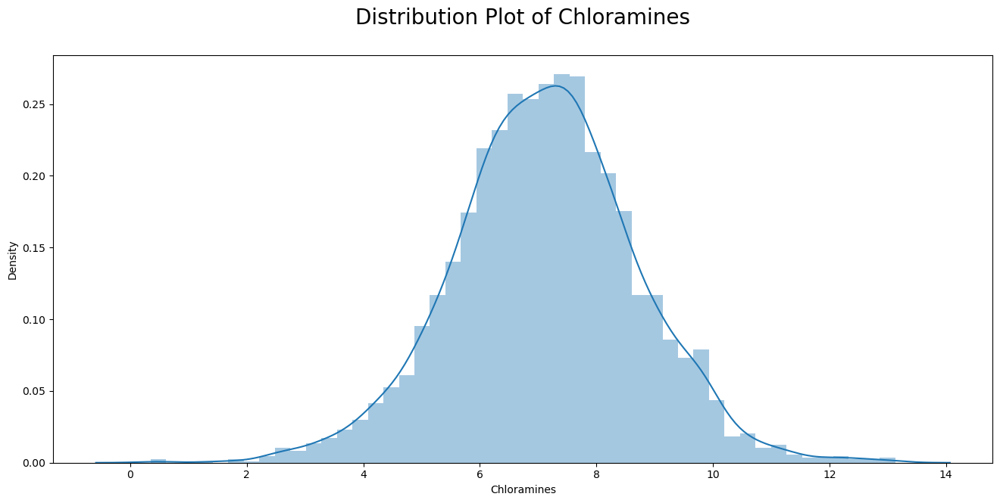

In [28]:
plt.figure(figsize = (16, 7))
sns.distplot(data['Chloramines'])
plt.title('Distribution Plot of Chloramines\n', fontsize =  20)
plt.show()

In [29]:
fig = px.line(x=range(data['Chloramines'].count()), y=sorted(data['Chloramines']),color=data['Potability'], labels={
                     'x': "Count",
                     'y': "Chloramines",
                     'color':'Potability'
                     
                 }, template = 'plotly_dark')
fig.update_layout(title='Chloramines wrt Potability')
fig.show()

In [30]:
fig = px.box(x = 'Chloramines', data_frame = data, template = 'plotly_dark')
fig.update_layout(title='Chloramines')
fig.show()

In [31]:
data["Conductivity"].describe()

count    3276.000000
mean      426.205111
std        80.824064
min       181.483754
25%       365.734414
50%       421.884968
75%       481.792304
max       753.342620
Name: Conductivity, dtype: float64

C:\Users\ASL\AppData\Local\Temp\ipykernel_3240\2040502749.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




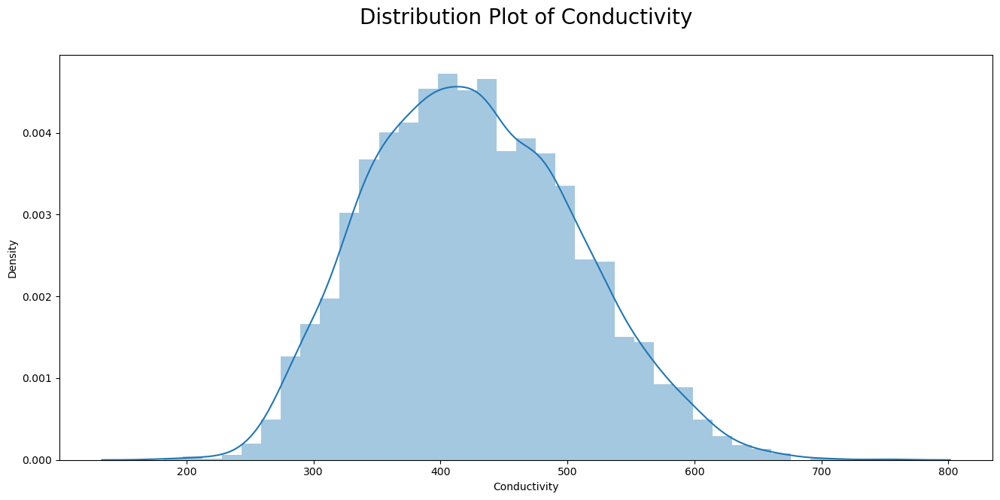

In [32]:
plt.figure(figsize = (16, 7))
sns.distplot(data['Conductivity'])
plt.title('Distribution Plot of Conductivity\n', fontsize =  20)
plt.show()

In [33]:
fig = px.bar(data, x=range(data['Conductivity'].count()),
             y=sorted(data['Conductivity']), labels={
                     'x': "Count",
                     'y': "Conductivity",
                     'color':'Potability'
                     
                 },
             color=data['Potability']
             ,template = 'plotly_dark')
fig.update_layout(title='Conductivity wrt Potability')
fig.show() 

In [34]:

data['Organic_carbon'].describe()

count    3276.000000
mean       14.284970
std         3.308162
min         2.200000
25%        12.065801
50%        14.218338
75%        16.557652
max        28.300000
Name: Organic_carbon, dtype: float64

In [35]:
group_labels = ['Organic_carbon'] 

fig = ff.create_distplot([data['Organic_carbon']], group_labels)
fig.show()

In [36]:
dt_5=data[data['Organic_carbon']<5]
dt_5_10=data[(data['Organic_carbon']>5)&(data['Organic_carbon']<10)]
dt_10_15=data[(data['Organic_carbon']>10)&(data['Organic_carbon']<15)]
dt_15_20=data[(data['Organic_carbon']>15)&(data['Organic_carbon']<20)]
dt_20_25=data[(data['Organic_carbon']>20)&(data['Organic_carbon']<25)]
dt_25=data[(data['Organic_carbon']>25)]

x_Age = ['5', '5-10', '10-15', '15-20', '25+']
y_Age = [len(dt_5.values), len(dt_5_10.values), len(dt_10_15.values), len(dt_15_20.values),
     len(dt_25.values)]

px.bar(data_frame = data, x = x_Age, y = y_Age, color = x_Age, template = 'plotly_dark',
       title = 'Frequency of Number Of Carbons')

In [37]:
data['Turbidity'].describe()

count    3276.000000
mean        3.966786
std         0.780382
min         1.450000
25%         3.439711
50%         3.955028
75%         4.500320
max         6.739000
Name: Turbidity, dtype: float64

In [38]:
group_labels = ['Turbidity']

fig = ff.create_distplot([data['Turbidity']], group_labels)
fig.show()

In [39]:
data['ph_random'].describe()

count    3276.000000
mean        7.071639
std         1.607991
min         0.000000
25%         6.081460
50%         7.029490
75%         8.063147
max        14.000000
Name: ph_random, dtype: float64

In [40]:
group_labels = ['ph_random'] # name of the dataset

fig = ff.create_distplot([data['ph_random']], group_labels)
fig.show()

In [41]:
px.histogram(data_frame = data, x = 'ph_random', nbins = 10, color = 'Potability', marginal = 'box',
             template = 'plotly_dark')

In [42]:
data['Potability'].describe()

count    3276.000000
mean        0.390110
std         0.487849
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: Potability, dtype: float64

In [43]:
px.histogram(data_frame = data, x = 'Potability', color = 'Potability', marginal = 'box',
             template = 'plotly_dark')

In [44]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [45]:
X=data.drop(['Potability'],axis=1)
y=data['Potability']

In [46]:
scaler = StandardScaler()
x=scaler.fit_transform(X)

In [47]:
x_train,x_test,y_train,y_test = train_test_split(x,y,train_size=0.8,random_state=42)

In [48]:
from sklearn.linear_model import LogisticRegression
log = LogisticRegression(random_state=0).fit(x_train, y_train)
log.score(x_test, y_test)

0.6265243902439024

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


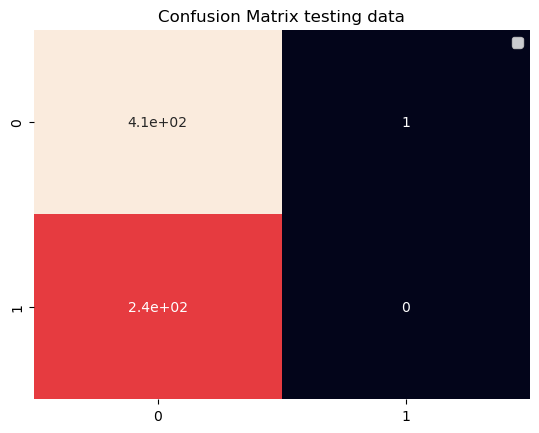

In [49]:
from sklearn.metrics import confusion_matrix

pred1=log.predict(np.array(x_test))
plt.title("Confusion Matrix testing data")
sns.heatmap(confusion_matrix(y_test,pred1),annot=True,cbar=False)
plt.legend()
plt.show()

In [50]:
from sklearn import svm
from sklearn.metrics import accuracy_score

In [52]:
svmc = svm.SVC()
svmc.fit(x_train, y_train)

y_pred = svmc.predict(x_test)
print(accuracy_score(y_test,y_pred))

0.6783536585365854


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


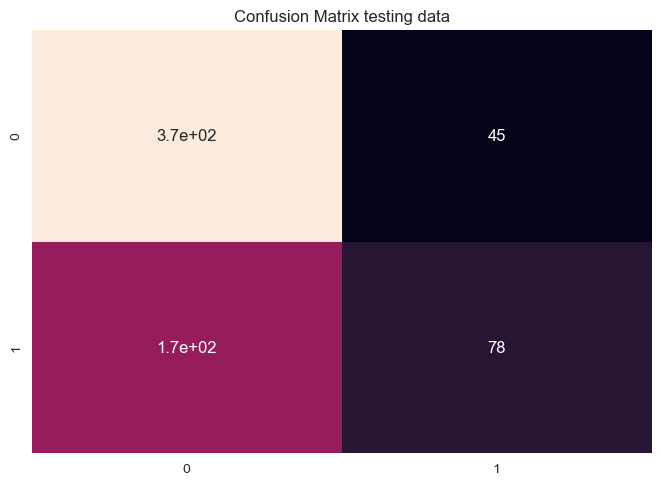

In [61]:
from sklearn.metrics import confusion_matrix

pred1=svmc.predict(np.array(x_test))
plt.title("Confusion Matrix testing data")
sns.heatmap(confusion_matrix(y_test,pred1),annot=True,cbar=False)
plt.legend()
plt.show()

In [62]:
from sklearn import tree
from sklearn.metrics import accuracy_score

In [63]:
tre = tree.DecisionTreeClassifier()
tre = tre.fit(x_train, y_train)

y_pred = tre.predict(x_test)
print(accuracy_score(y_test,y_pred))

0.5853658536585366


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


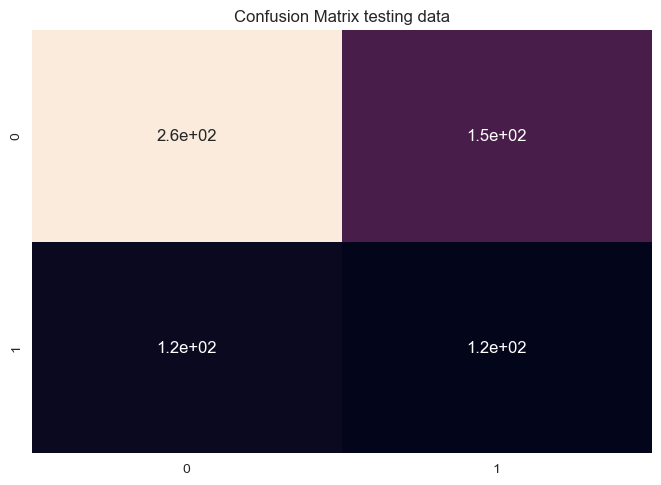

In [64]:
from sklearn.metrics import confusion_matrix

pred1=tre.predict(np.array(x_test))
plt.title("Confusion Matrix testing data")
sns.heatmap(confusion_matrix(y_test,pred1),annot=True,cbar=False)
plt.legend()
plt.show()

In [65]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

In [66]:
model_rf = RandomForestClassifier(n_estimators=500, oob_score=True, random_state=100)

model_rf=model_rf.fit(x_train, y_train) 

y_pred = model_rf.predict(x_test)
print(accuracy_score(y_test,y_pred))

0.6875


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


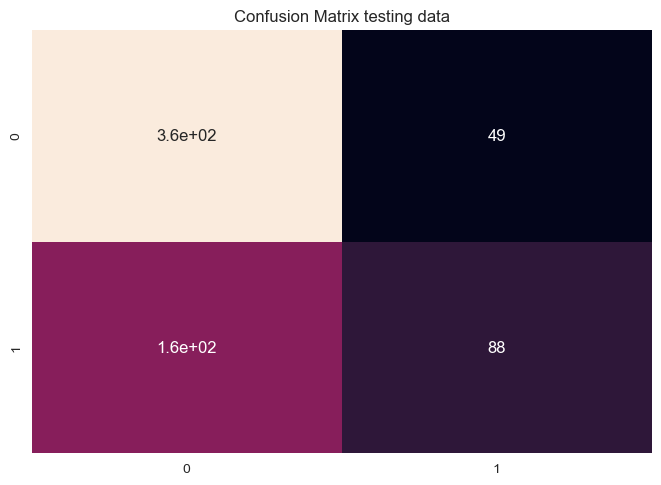

In [67]:
from sklearn.metrics import confusion_matrix

pred1=model_rf.predict(np.array(x_test))
plt.title("Confusion Matrix testing data")
sns.heatmap(confusion_matrix(y_test,pred1),annot=True,cbar=False)
plt.legend()
plt.show()

In [53]:
from pycaret.classification import *

In [54]:
data.head()

,Hardness,Solids,Chloramines,Conductivity,Organic_carbon,Turbidity,Potability,ph_random,Sulfate_random,Trihalomethanes_random
0,204.890455,20791.318981,7.300212,564.308654,10.379783,2.963135,0,9.074923,368.516441,86.990970
1,129.422921,18630.057858,6.635246,592.885359,15.180013,4.500656,0,3.716080,298.082462,56.329076
2,224.236259,19909.541732,9.275884,418.606213,16.868637,3.055934,0,8.099124,367.224297,66.420093
3,214.373394,22018.417441,8.059332,363.266516,18.436524,4.628771,0,8.316766,356.886136,100.341674
4,181.101509,17978.986339,6.546600,398.410813,11.558279,4.075075,0,9.092223,310.135738,31.997993


In [55]:
cat_features = ['Hardness', 'Solids' ,'Chloramines', 'Conductivity', 'Organic_carbon', 'Turbidity', 'ph_random', 'Sulfate_random', 'Trihalomethanes_random']

In [56]:
experiment = setup(data, target='Potability', categorical_features=cat_features)

,Description,Value
0,Session id,2391
1,Target,Potability
2,Target type,Binary
3,Original data shape,"(3276, 10)"
4,Transformed data shape,"(3276, 10)"
5,Transformed train set shape,"(2293, 10)"
6,Transformed test set shape,"(983, 10)"
7,Categorical features,9
8,Preprocess,True
9,Imputation type,simple


In [57]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.6638,0.6770,0.2985,0.6527,0.4082,0.2172,0.2500,0.1290
rf,Random Forest Classifier,0.6585,0.6665,0.3421,0.6117,0.4374,0.2205,0.2399,0.2400
qda,Quadratic Discriminant Analysis,0.6581,0.6623,0.3051,0.6349,0.4105,0.2087,0.2379,0.0490
lightgbm,Light Gradient Boosting Machine,0.6380,0.6439,0.3890,0.5508,0.4548,0.1966,0.2035,0.1750
gbc,Gradient Boosting Classifier,0.6337,0.6254,0.2549,0.5670,0.3494,0.1452,0.1675,0.4030
nb,Naive Bayes,0.6262,0.5974,0.2191,0.5550,0.3122,0.1188,0.1434,0.0330
dummy,Dummy Classifier,0.6097,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0640
lr,Logistic Regression,0.6092,0.5127,0.0000,0.0000,0.0000,-0.0009,-0.0053,3.4900
ridge,Ridge Classifier,0.6092,0.0000,0.0000,0.0000,0.0000,-0.0009,-0.0053,0.2710
lda,Linear Discriminant Analysis,0.6088,0.5082,0.0000,0.0000,0.0000,-0.0017,-0.0106,0.0720


In [58]:
predict_model(best_model, data.head())

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extra Trees Classifier,1.0000,0,0.0000,0.0000,0.0000,nan,0.0000


,Hardness,Solids,Chloramines,Conductivity,Organic_carbon,Turbidity,ph_random,Sulfate_random,Trihalomethanes_random,Potability,prediction_label,prediction_score
0,204.890457,20791.318359,7.300212,564.308655,10.379783,2.963135,9.074923,368.516449,86.990967,0,0,1.00
1,129.422928,18630.058594,6.635246,592.885376,15.180013,4.500656,3.716080,298.082458,56.329075,0,0,0.72
2,224.236252,19909.541016,9.275884,418.606201,16.868637,3.055934,8.099124,367.224304,66.420090,0,0,1.00
3,214.373398,22018.417969,8.059333,363.266510,18.436525,4.628770,8.316766,356.886139,100.341675,0,0,0.65
4,181.101517,17978.986328,6.546600,398.410828,11.558279,4.075076,9.092223,310.135742,31.997993,0,0,0.74


In [68]:
save_model(best_model, model_name='et-model')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None, include=[],
                                     transformer=SimpleImputer(add_indicator=False,
                                                               copy=True,
                                                               fill_value=None,
                                                               keep_empty_features=False,
                                                               missing_values=nan,
                                                               strategy='mean'))),
                 ('categorical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['Hardness', 'Solids',
                                              'Chloramines', 'Conduc...
                  ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                                       class_weight=None, cri

In [69]:
model = load_model('et-model')

Transformation Pipeline and Model Successfully Loaded


In [78]:
!pip install tensorflow

In [79]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

In [80]:
X = data.drop('Potability', axis=1)
y = data['Potability']


In [81]:
scaler = StandardScaler()
X = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [82]:
def create_model(input_dim, layers, dropout_rate=0.2):
    model = Sequential()
    for units in layers:
        model.add(Dense(units, activation='relu', input_dim=input_dim))
        model.add(Dropout(dropout_rate))
        input_dim = units
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

model1 = create_model(input_dim=X_train.shape[1], layers=[64, 32])
model2 = create_model(input_dim=X_train.shape[1], layers=[128, 64, 32])
model3 = create_model(input_dim=X_train.shape[1], layers=[128, 128, 64, 32], dropout_rate=0.3)

In [83]:
models = [model1, model2, model3]
histories = []

for i, model in enumerate(models):
    print(f"Training Model {i+1}")
    history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_data=(X_test, y_test), verbose=1)
    histories.append(history)

Training Model 1
Epoch 1/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5660 - loss: 0.6950 - val_accuracy: 0.6296 - val_loss: 0.6587
Epoch 2/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5923 - loss: 0.6758 - val_accuracy: 0.6479 - val_loss: 0.6465
Epoch 3/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6295 - loss: 0.6526 - val_accuracy: 0.6524 - val_loss: 0.6341
Epoch 4/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6255 - loss: 0.6510 - val_accuracy: 0.6692 - val_loss: 0.6297
Epoch 5/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6276 - loss: 0.6481 - val_accuracy: 0.6570 - val_loss: 0.6254
Epoch 6/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6496 - loss: 0.6365 - val_accuracy: 0.6723 - val_loss: 0.6189
Epoch 7/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6384 - loss: 0.6379 - val_accuracy: 0.6799 - val_loss: 0.6141
Epoch 8/50
82/82 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6507 - loss: 0.6358 - val_accuracy: 0

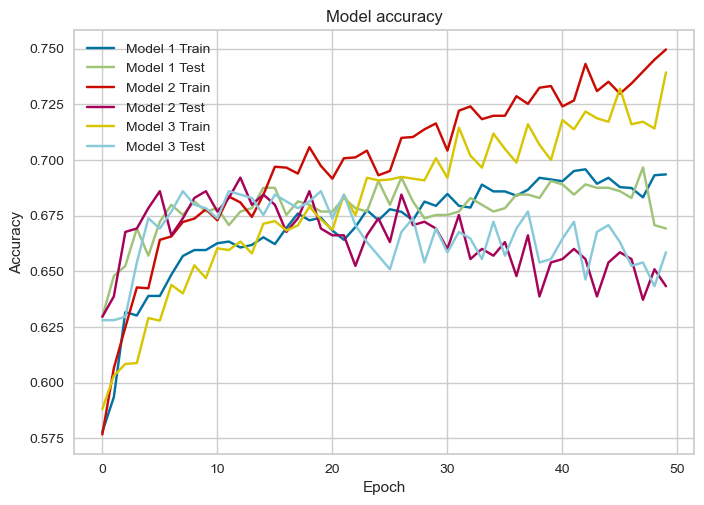

In [84]:
for i, history in enumerate(histories):
    plt.plot(history.history['accuracy'], label=f'Model {i+1} Train')
    plt.plot(history.history['val_accuracy'], label=f'Model {i+1} Test')

plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.show()

In [85]:
best_model = models[2]  # Let's assume the third model performs the best
loss, accuracy = best_model.evaluate(X_test, y_test)
print(f"Best Model Test Accuracy: {accuracy * 100:.2f}%")

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6685 - loss: 0.6347
Best Model Test Accuracy: 65.85%
